# Trabajo Final - Procesamiento Digital de Imágenes Satelitales
# Clasificación de Imagen Sentinel-2


##Curso electivo: Procesamiento digital de imágenes satelitales y datos geoespaciales
##Diplomatura en Tópicos sobre Ciencia de Datos - FCEFyN UNRC
##Profesor: Santiago Seppi
##Estudiantes: Aimé Aminahuel, Florencia Donadio, Emilia Musso
##Fecha de entrega: 06/05/2025

## Librerías

In [ ]:
!pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 70.5 MB/s eta 0:00:00


In [ ]:
import numpy as np
import gdown
from shapely.geometry import shape

In [ ]:
import numpy as np
import pandas as pd
import geopandas as gpd
import ipywidgets as widgets
from IPython.display import display, HTML
from google.colab.output import eval_js
from base64 import b64encode
from PIL import Image
import io
from shapely.geometry import box
from matplotlib import pyplot as plt
import rasterio
import rasterio.transform

## Funciones

In [ ]:
def escalar_imagen(imagen, p, nodata = None):
  # Calcular los percentiles p y 100-p
  valor_min = np.percentile(imagen[imagen != nodata], p)
  valor_max = np.percentile(imagen[imagen != nodata], 100-p)

  # Truncar la imagen al rango [p1, p99]
  ecualizada = np.clip(imagen, valor_min, valor_max)

  # Normalizar la imagen al rango 0-255.
  ecualizada = (ecualizada - valor_min) / (valor_max - valor_min) * 255

  # Convertir la imagen ecualizada a entero de 8 bits
  ecualizada = np.uint8(ecualizada)

  # Retornar la imagen ecualizada
  return ecualizada

def escalar_imagen_multibanda(imagen, p, nodata = None):
  # Crear un array vacio con la misma estructura que imagen_spot_apilada
  imagen_escalada = np.empty_like(imagen)

  # Definir una variable con el número de canales
  canales = imagen_escalada.shape[-1]

  # Escalar una a una las bandas (usando p)
  for i in range(canales):
    canal = imagen[:, :, i]
    imagen_escalada[:, :, i] = escalar_imagen(canal, p, nodata = nodata)

  # Convertir a np.uint8 el array escalado (no hace falta seguir usando float)
  imagen_escalada = np.uint8(imagen_escalada)

  return imagen_escalada

In [ ]:
class Extractor():
    def __init__(self, img_np, img_rgb, metadata) -> None:
        self.extracted_dataframe = pd.DataFrame()
        self.extracted_polygons = gpd.GeoDataFrame()  # GeoDataFrame para polígonos georreferenciados
        self.img_np = img_np
        self.img_rgb = img_rgb
        self.metadata = metadata  # Diccionario de metadatos de rasterio
        self.callback = self.manejar_df_extraido

    def manejar_df_extraido(self, df, polygons):
        self.extracted_dataframe = df.copy()
        self.extracted_polygons = polygons  # Guardar el GeoDataFrame de polígonos extraídos

    def interfaz_seleccion_pixeles(self):
        scale_factor = 2.5  # Factor de escalado (aumenta el tamaño de la imagen)
        img_pil = Image.fromarray(self.img_rgb)
        buffered = io.BytesIO()
        img_pil.save(buffered, format="PNG")
        img_b64 = b64encode(buffered.getvalue()).decode()

        new_width = self.img_rgb.shape[1] * scale_factor
        new_height = self.img_rgb.shape[0] * scale_factor

        js_code = f"""
        <style>
          canvas {{ border: 3px solid black; display: block; margin: auto; }}
        </style>
        <canvas id="canvas" width="{new_width}" height="{new_height}"></canvas>
        <script>
          var scaleFactor = {scale_factor};
          var canvas = document.getElementById('canvas');
          var ctx = canvas.getContext('2d');
          var img = new Image();
          img.src = "data:image/png;base64,{img_b64}";
          img.onload = function() {{
              ctx.drawImage(img, 0, 0, canvas.width, canvas.height);
          }};

          var rects = [];
          var startX, startY, drawing = false;

          canvas.addEventListener('mousedown', function(e) {{
              startX = e.offsetX / scaleFactor;
              startY = e.offsetY / scaleFactor;
              drawing = true;
          }});

          canvas.addEventListener('mouseup', function(e) {{
              if (!drawing) return;
              drawing = false;
              var endX = e.offsetX / scaleFactor;
              var endY = e.offsetY / scaleFactor;
              rects.push([startX, startY, endX, endY]);

              ctx.strokeStyle = 'red';
              ctx.lineWidth = 2;
              ctx.strokeRect(startX * scaleFactor, startY * scaleFactor,
                             (endX - startX) * scaleFactor,
                             (endY - startY) * scaleFactor);
          }});

          function getRects() {{ return rects; }}
          function clearRects() {{
              rects = [];
              ctx.clearRect(0, 0, canvas.width, canvas.height);
              ctx.drawImage(img, 0, 0, canvas.width, canvas.height);
          }}
        </script>
        """
        display(HTML(js_code))

        def get_rectangles():
            return eval_js("getRects()")

        def extract_pixels():
            rects = get_rectangles()
            if not rects:
                print("No rectangles drawn.")
                return pd.DataFrame(), gpd.GeoDataFrame()

            dataframes = []
            extracted_polygons = []
            transform = self.metadata.get("transform")
            crs = self.metadata.get("crs")

            for i, (x1, y1, x2, y2) in enumerate(rects):
                x1, x2 = sorted([int(x1), int(x2)])
                y1, y2 = sorted([int(y1), int(y2)])

                # Convertir a coordenadas georreferenciadas
                lon1, lat1 = rasterio.transform.xy(transform, y1, x1, offset='center')
                lon2, lat2 = rasterio.transform.xy(transform, y2, x2, offset='center')
                polygon = box(lon1, lat1, lon2, lat2)
                extracted_polygons.append(polygon)

                # Extraer valores de todas las bandas
                selected_pixels = self.img_np[:, y1:y2, x1:x2]
                pixel_values = selected_pixels.reshape(selected_pixels.shape[0], -1).T
                df = pd.DataFrame(pixel_values, columns=[f"Band_{b}" for b in range(self.img_np.shape[0])])
                df["X"] = np.tile(np.arange(x1, x2), y2 - y1)
                df["Y"] = np.repeat(np.arange(y1, y2), x2 - x1)
                df["Rect_ID"] = i + 1
                dataframes.append(df)

            # Crear un GeoDataFrame con los polígonos y asignar el CRS
            gdf = gpd.GeoDataFrame(geometry=extracted_polygons, crs=crs)

            return pd.concat(dataframes, ignore_index=True) if dataframes else pd.DataFrame(), gdf

        extract_button = widgets.Button(description="Extraer Valores")
        clear_button = widgets.Button(description="Borrar Todo")
        output = widgets.Output()

        def on_extract_clicked(b):
            with output:
                output.clear_output()
                extracted_df, extracted_polygons = extract_pixels()
                if self.callback:
                    self.manejar_df_extraido(extracted_df, extracted_polygons)

        def on_clear_clicked(b):
            eval_js("clearRects()")

        extract_button.on_click(on_extract_clicked)
        clear_button.on_click(on_clear_clicked)

        display(extract_button, clear_button, output)
        return None

In [ ]:
def ajustar_poligono(poligono, snap_to_grid = True, grid_step = 10):
    """dado un vector de polígonos, calcula el mínimo rectángulo que lo contiene, usando vértices
    en una grilla de paso dado."""

    x_min, y_min, x_max, y_max = poligono.total_bounds
    if snap_to_grid:
        x_min = grid_step*np.floor(x_min/grid_step)
        x_max = grid_step*np.ceil(x_max/grid_step)
        y_min = grid_step*np.floor(y_min/grid_step)
        y_max = grid_step*np.ceil(y_max/grid_step)

    min_r = shape({'type': 'Polygon',
          'coordinates': [((x_min, y_max),
                           (x_max, y_max),
                           (x_max, y_min),
                           (x_min, y_min),
                           (x_min, y_max))]})
    return gpd.GeoDataFrame(geometry=[min_r], crs=poligono.crs)

In [ ]:
def obtener_firmas(seleccion_pixeles):
  df = seleccion_pixeles.extracted_dataframe.copy()
  bandas_promedio = df[['Band_0', 'Band_1', 'Band_2', 'Band_3', 'Band_4', 'Band_5']].mean().to_numpy()
  bandas_std = df[['Band_0', 'Band_1', 'Band_2', 'Band_3', 'Band_4', 'Band_5']].std().to_numpy()

  return bandas_promedio, bandas_std

In [ ]:
from rasterio.mask import mask
def leer_bandas_l2a(zipfilename, bands_to_extract, res, poligono = None):
  zfile = ZipFile(zipfilename,'r')
  stack_bandas = []

  for bnd in zfile.namelist():
    dirname = os.path.basename(os.path.dirname(bnd))

    if dirname == f'R{res}m' and bnd.endswith('.jp2'):
        if os.path.basename(bnd).split('_')[2] in bands_to_extract:
            fname = f'/vsizip/{zipfilename}/{bnd}' # Agregmos /vsizip/ a cada ruta
            ds = rasterio.open(fname)
            metadatos = ds.meta
            if poligono is not None:
              clip, clip_transform = rasterio.mask.mask(ds, poligono.geometry, crop=True) # Extraemos una sección de la imagen solamente
              stack_bandas.append(clip[0])
              metadatos['transform'] = clip_transform # Si recortamos, actualizamos el transform de los metadatos
              metadatos['height'] = clip.shape[1] # Si recortamos, actualizamos el height de los metadatos
              metadatos['width'] = clip.shape[2] # Si recortamos, actualizamos el width de los metadatos
            else:
              stack_bandas.append(ds.read()[0]) # Leemos como array 2D y lo agregamos a stack_bandas
  stack_bandas = np.array(stack_bandas)
  metadatos['count'] = stack_bandas.shape[0] # Actualizamos el count o numero de bandas
  metadatos['driver'] = 'GTiff' # Cambiamos el driver a GeoTiff
  return stack_bandas, metadatos

In [ ]:
import numpy as np
import scipy.ndimage

def resample_bands(src_bands, ref_bands):
    """
    Realiza el remuestreo del stack src_bands para que coincida en dimensiones con ref_bands.
    """
    b, r_target, c_target = src_bands.shape[0], ref_bands.shape[1], ref_bands.shape[2]
    r_src, c_src = src_bands.shape[1], src_bands.shape[2]

    zoom_factor_r = r_target / r_src
    zoom_factor_c = c_target / c_src

    src_resample = np.zeros((b, r_target, c_target))

    for i in range(b):
        # Realizamos el zoom con interpolación bilineal (order=1)
        band_zoomed = scipy.ndimage.zoom(src_bands[i], (zoom_factor_r, zoom_factor_c), order=1)

        # Ajustamos tamaño si hay diferencia por redondeo
        band_resized = band_zoomed[:r_target, :c_target]  # Corte seguro

        src_resample[i] = band_resized

    return src_resample

## 1. Carga de imagen Sentinel-2

In [ ]:
#https://drive.google.com/file/d/1G5KiNx0po-TIA-mC6Hz20Q-cY0uUEJM0/view?usp=sharing
import gdown


# ID del archivo de Google Drive
file_id = "1G5KiNx0po-TIA-mC6Hz20Q-cY0uUEJM0"
url = f"https://drive.google.com/uc?id={file_id}"

# Descargar la imagen
output = "S2A_MSIL2A_20180405T141051_N0500_R110_T20HLK_20230907T093317.SAFE.zip"
gdown.download(url, output, quiet=False)

Downloading...
From (original): https://drive.google.com/uc?id=1G5KiNx0po-TIA-mC6Hz20Q-cY0uUEJM0
From (redirected): https://drive.google.com/uc?id=1G5KiNx0po-TIA-mC6Hz20Q-cY0uUEJM0&confirm=t&uuid=f7ab1d2b-735a-44e9-adbf-8b95daa75a4f
To: /content/S2A_MSIL2A_20180405T141051_N0500_R110_T20HLK_20230907T093317.SAFE.zip
100%|██████████| 989M/989M [00:17<00:00, 55.8MB/s]


'S2A_MSIL2A_20180405T141051_N0500_R110_T20HLK_20230907T093317.SAFE.zip'

In [ ]:
from zipfile import ZipFile
import re
import os
import rasterio

# Leer el archivo ZIP
zipfilename='S2A_MSIL2A_20180405T141051_N0500_R110_T20HLK_20230907T093317.SAFE.zip'
zfile = ZipFile(zipfilename,'r')

# Definir qué bandas y a qué resolución las quiero (solo las de 10 metros)
bands_to_extract = ['B02', 'B03', 'B04', 'B08']
bnd_list = []
res = 10

# Buscar esas bandas dentro de la carpeta de la resolución indicada, es como un filtro que estoy haciendo sobre mis archivo
#el split lo que esta haciendo separar por _ y ver si en tercer lugar tiene el nombre de alguna banda que me interesa
for bnd in zfile.namelist():
    dirname = os.path.basename(os.path.dirname(bnd)) #me tira cual es la carp que lo contiene
    if dirname == f'R{res}m' and bnd.endswith('.jp2'):
        if os.path.basename(bnd).split('_')[2] in bands_to_extract:
            bnd_list.append(bnd)

# Imprimir la lista encontrada
print("\n".join(bnd_list))

S2A_MSIL2A_20180405T141051_N0500_R110_T20HLK_20230907T093317.SAFE/GRANULE/L2A_T20HLK_A014550_20180405T141046/IMG_DATA/R10m/T20HLK_20180405T141051_B02_10m.jp2
S2A_MSIL2A_20180405T141051_N0500_R110_T20HLK_20230907T093317.SAFE/GRANULE/L2A_T20HLK_A014550_20180405T141046/IMG_DATA/R10m/T20HLK_20180405T141051_B03_10m.jp2
S2A_MSIL2A_20180405T141051_N0500_R110_T20HLK_20230907T093317.SAFE/GRANULE/L2A_T20HLK_A014550_20180405T141046/IMG_DATA/R10m/T20HLK_20180405T141051_B04_10m.jp2
S2A_MSIL2A_20180405T141051_N0500_R110_T20HLK_20230907T093317.SAFE/GRANULE/L2A_T20HLK_A014550_20180405T141046/IMG_DATA/R10m/T20HLK_20180405T141051_B08_10m.jp2


In [ ]:
# Iniciamos una lista vacía para almacenar las bandas:
stack_bandas = []

import numpy

for bnd in bnd_list:
    fname = f'/vsizip/{zipfilename}/{bnd}' # Agregmos /vsizip/ a cada ruta
    ds = rasterio.open(fname)
    stack_bandas.append(ds.read()[0]) # Leemos como array 2D y lo agregamos a stack_bandas

# Convertir la lista en array
stack_bandas = numpy.array(stack_bandas)
print(f'Dimensiones del nuevo array: {stack_bandas.shape}')

# Leer los metadatos
metadatos = ds.meta

Dimensiones del nuevo array: (4, 10980, 10980)


In [ ]:
metadatos

{'driver': 'JP2OpenJPEG',
 'dtype': 'uint16',
 'nodata': None,
 'width': 10980,
 'height': 10980,
 'count': 1,
 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 20S",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-63],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",10000000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32720"]]'),
 'transform': Affine(10.0, 0.0, 300000.0,
        0.0, -10.0, 6500020.0)}

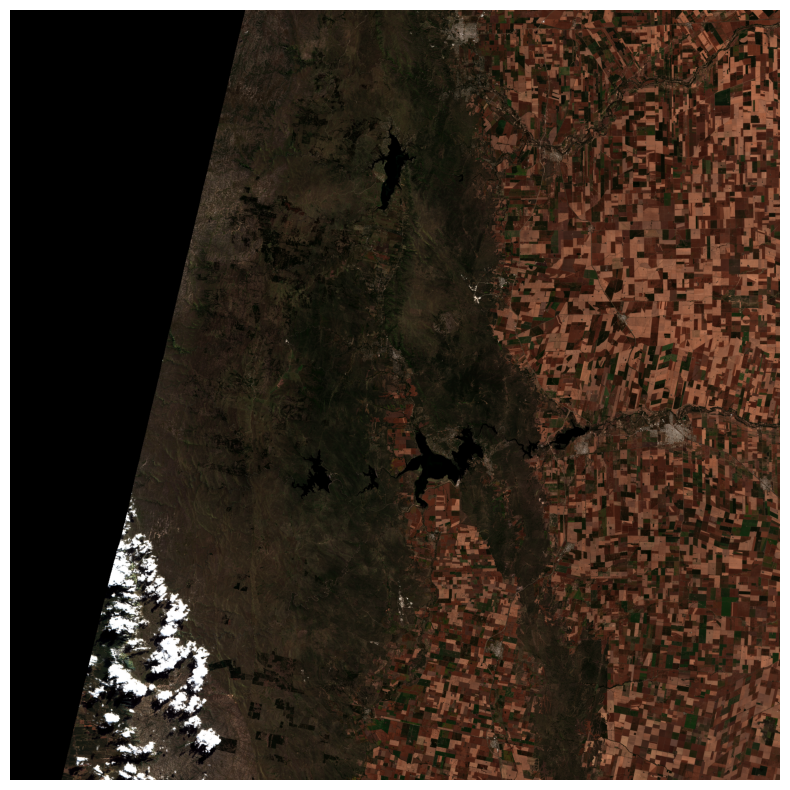

In [ ]:
from matplotlib import pyplot as plt

stack_bandas_escalado = escalar_imagen_multibanda(stack_bandas.transpose(1,2,0), 1, nodata = 0)

plt.figure(figsize=(10,10))
plt.imshow(stack_bandas_escalado[:,:,[2,1,0]])
plt.axis('off')
plt.show()

In [ ]:
from rasterio.crs import CRS
from affine import Affine

metadatos_stack = {'driver': 'GTiff',
 'dtype': 'uint16',
 'nodata': 0,
 'width': stack_bandas.shape[2],
 'height': stack_bandas.shape[1],
 'count': stack_bandas.shape[0],
 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 20S",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-63],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",10000000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32720"]]'),
 'transform': Affine(10.0, 0.0, 300000.0,
        0.0, -10.0, 6500020.0)}


# Abrir el archivo en modo escritura
with rasterio.open("s2c_stack_3317.tif", 'w', **metadatos_stack) as dataset:
  for i,b in enumerate(bands_to_extract):
    dataset.set_band_description(i+1, b) #Agregar una descripción del nombre de la banda desde bands_to_extract
  dataset.write(stack_bandas) #Escribir el array

## 2. Recorte de la imagen para entrenamiento del modelo (recorte 1)
Polígono generado en QGIS (GEOPACKAGE)


In [ ]:
#https://drive.google.com/file/d/141Qh_qKhK0q_dutzSmA5-Yg7eOi1m2RT/view?usp=sharing
import geopandas as gpd

# ID del archivo de Google Drive
file_id = "141Qh_qKhK0q_dutzSmA5-Yg7eOi1m2RT"
url = f"https://drive.google.com/uc?id={file_id}"

# Descargar la imagen
output = "recorte1.gpkg"
gdown.download(url, output, quiet=False)

# Leer el polígono
poligono = gpd.read_file("recorte1.gpkg", layer='recorte1')

Downloading...
From: https://drive.google.com/uc?id=141Qh_qKhK0q_dutzSmA5-Yg7eOi1m2RT
To: /content/recorte1.gpkg
100%|██████████| 115k/115k [00:00<00:00, 9.39MB/s]


In [ ]:
print(poligono)
print(f'Tipo de objeto: {type(poligono)}')
print(f'Extensión del polígono: {poligono.total_bounds}')
print(f'Sistema de coordenadas del polígono: {poligono.crs}')

                                            geometry
0  POLYGON ((363455.814 6438691.881, 363497.385 6...
Tipo de objeto: <class 'geopandas.geodataframe.GeoDataFrame'>
Extensión del polígono: [ 363455.8136268  6431583.25478891  373224.97829026 6438691.88099083]
Sistema de coordenadas del polígono: EPSG:32720


In [ ]:
poligono = ajustar_poligono(poligono)

print(f'Extensión ajustada del polígono: {poligono.total_bounds}')

Extensión ajustada del polígono: [ 363450. 6431580.  373230. 6438700.]


<Axes: >

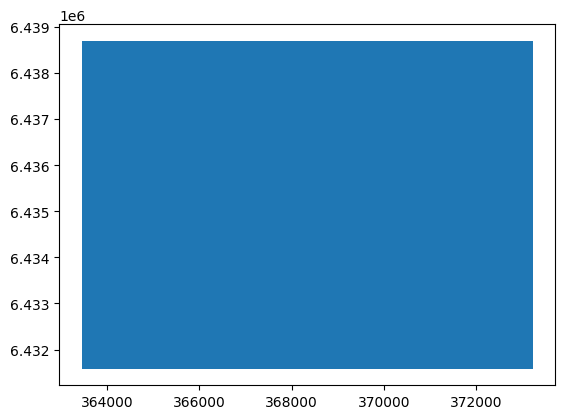

In [ ]:
poligono.plot()

In [ ]:
from rasterio.mask import mask

s2_clip, clip_transform = mask(dataset=ds,shapes = poligono.geometry, crop = True)
print('Nuevo transform: ', clip_transform)
print('Dimensiones del recorte', s2_clip.shape)
print('Dimensiones del array original', stack_bandas.shape)

Nuevo transform:  | 10.00, 0.00, 363450.00|
| 0.00,-10.00, 6438700.00|
| 0.00, 0.00, 1.00|
Dimensiones del recorte (1, 712, 978)
Dimensiones del array original (4, 10980, 10980)


In [ ]:
# extracción de bandas de 10 metros aplicando recorte con poligono
bands_to_extract =  ['B02', 'B03', 'B04', 'B08']
res = 10
stack_recorte_10m, metadatos_recorte_10m = leer_bandas_l2a(zipfilename, bands_to_extract, res, poligono = poligono)
metadatos_recorte_10m

{'driver': 'GTiff',
 'dtype': 'uint16',
 'nodata': None,
 'width': 978,
 'height': 712,
 'count': 4,
 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 20S",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-63],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",10000000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32720"]]'),
 'transform': Affine(10.0, 0.0, 363450.0,
        0.0, -10.0, 6438700.0)}

In [ ]:
# extracción de bandas de 20 metros aplicando recorte con poligono
bands_to_extract =  ['B11', 'B12']
res = 20
stack_recorte_20m, metadatos_recorte_20m = leer_bandas_l2a(zipfilename, bands_to_extract, res, poligono = poligono)
metadatos_recorte_20m

{'driver': 'GTiff',
 'dtype': 'uint16',
 'nodata': None,
 'width': 490,
 'height': 356,
 'count': 2,
 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 20S",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-63],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",10000000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32720"]]'),
 'transform': Affine(20.0, 0.0, 363440.0,
        0.0, -20.0, 6438700.0)}

In [ ]:
# Remuestrar las bandas de 20 a la resolución de stack_recorte_10m
stack_b11_b12_10m = resample_bands(stack_recorte_20m, stack_recorte_10m)
print(f'Dimensiones del stack remuestreado: {stack_b11_b12_10m.shape}')

Dimensiones del stack remuestreado: (2, 712, 978)


In [ ]:
# Juntar ambos arrays
stack_final = np.concatenate((stack_recorte_10m, stack_b11_b12_10m), axis = 0)
print(f'Dimensiones del stack final: {stack_final.shape}')

Dimensiones del stack final: (6, 712, 978)


In [ ]:
poligono.total_bounds

array([ 363450., 6431580.,  373230., 6438700.])

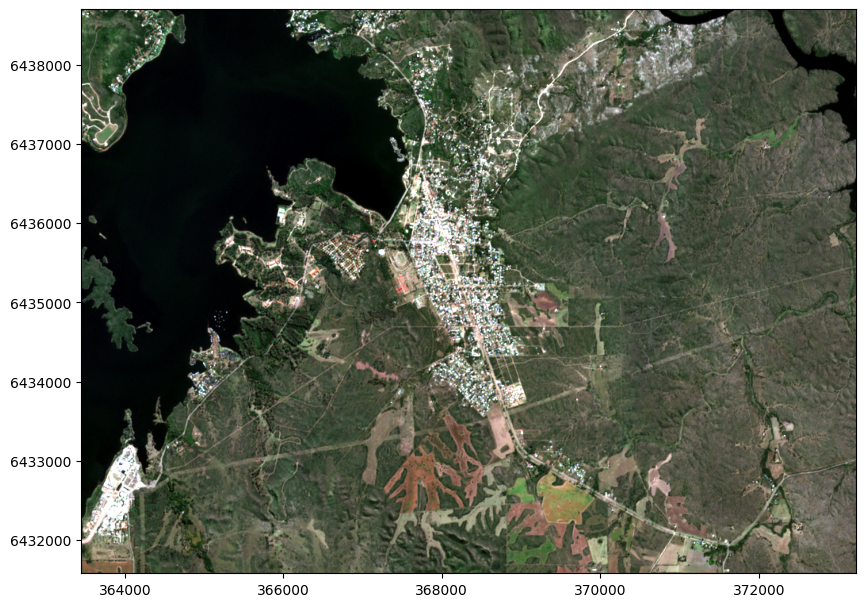

In [ ]:
# Visualizacion de la imagen completa

from matplotlib import pyplot as plt

# el valor de relleno o de _no dato_ en estas imágenes es `0`. Por lo tanto, si queremos hacer laguna visualización en RGB necesitamos pasar ese número como `nodata`
stack_recorte_escalado = escalar_imagen_multibanda(stack_final.transpose(1,2,0), 1, nodata = 0)

left, bottom, right, top = poligono.total_bounds # Extraer los límites

plt.figure(figsize=(10,10))
plt.imshow(stack_recorte_escalado[:,:,[2,1,0]], extent=[left, right, bottom, top], origin="upper")
plt.ticklabel_format(style="plain", axis="y")
plt.show()

In [ ]:
# guardar el archivo como GeoTiff

from rasterio.crs import CRS
from affine import Affine

metadatos_stack_final = {'driver': 'GTiff',
 'dtype': 'uint16',
 'nodata': 0,
 'width': stack_final.shape[2],
 'height': stack_final.shape[1],
 'count': stack_final.shape[0],
 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 20S",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-63],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",10000000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32720"]]'),
 'transform': metadatos_recorte_10m['transform']}

# Lista de bandas para set_band_description:
band_list = ['B02', 'B03', 'B04', 'B08', 'B11', 'B12']

# Abrir el archivo en modo escritura
with rasterio.open("S2A_MSIL2A_20180405T141051_embalse.tif", 'w+', **metadatos_stack_final) as dataset:
  for i,b in enumerate(band_list):
    dataset.set_band_description(i+1, b) #Agregar una descripción del nombre de la banda desde band_list
  dataset.write(stack_final) #Escribir el array

##3. Extracción de muestras para el entrenamiento del modelo
No ejecutar

In [ ]:
# Leer la imagen s2_clip.tif
s2 = rasterio.open('S2A_MSIL2A_20180405T141051_embalse.tif')

# Leer los metadatos
metadatos = s2.meta

# Leer como array de numpy
s2_clip = s2.read()

# Escalar para combinaciones RGB
s2_clip_escalado = escalar_imagen_multibanda(s2_clip.transpose(1,2,0), 1)

In [ ]:
# Agua
seleccion_pixeles_agua = Extractor(s2_clip, s2_clip_escalado[:,:,[4,3,2]], s2.meta)
seleccion_pixeles_agua.interfaz_seleccion_pixeles()

In [ ]:
# Vegetacion
seleccion_pixeles_vegetacion = Extractor(s2_clip, s2_clip_escalado[:,:,[4,3,2]], s2.meta)
seleccion_pixeles_vegetacion.interfaz_seleccion_pixeles()

In [ ]:
# Suelo desnudo
seleccion_pixeles_suelo = Extractor(s2_clip, s2_clip_escalado[:,:,[4,3,2]], s2.meta)
seleccion_pixeles_suelo.interfaz_seleccion_pixeles()

In [ ]:
# Zonas construidas
seleccion_pixeles_construido = Extractor(s2_clip, s2_clip_escalado[:,:,[4,3,2]], s2.meta)
seleccion_pixeles_construido.interfaz_seleccion_pixeles()

In [ ]:
seleccion_pixeles_agua.extracted_dataframe['Clase'] = 0
seleccion_pixeles_vegetacion.extracted_dataframe['Clase'] = 1
seleccion_pixeles_suelo.extracted_dataframe['Clase'] = 2
seleccion_pixeles_construido.extracted_dataframe['Clase'] = 3

In [ ]:
df_final = pd.concat([seleccion_pixeles_agua.extracted_dataframe,
                      seleccion_pixeles_vegetacion.extracted_dataframe,
                      seleccion_pixeles_suelo.extracted_dataframe,
                      seleccion_pixeles_construido.extracted_dataframe],
                      ignore_index=True)

In [ ]:
df_final.head()

In [ ]:
bandas_promedio = df_final[['Band_0', 'Band_1', 'Band_2', 'Band_3', 'Band_4', 'Band_5']].mean().to_numpy()
bandas_std = df_final[['Band_0', 'Band_1', 'Band_2', 'Band_3', 'Band_4', 'Band_5']].std().to_numpy()

In [ ]:
bandas_promedio_vegetacion, bandas_std_vegetacion = obtener_firmas(seleccion_pixeles_vegetacion)
bandas_promedio_suelo, bandas_std_suelo = obtener_firmas(seleccion_pixeles_suelo)
bandas_promedio_construido, bandas_std_construido = obtener_firmas(seleccion_pixeles_construido)

In [ ]:
# Longitudes de onda (en nanómetros) de las bandas Sentinel-2 utilizadas
wavelengths_nm = np.array([490, 560, 665, 842, 1610, 2190])  # Bandas 2, 3, 4, 8, 11, 12

# Definir bandas RGB para la imagen
bandas_rgb = [2, 1, 0]  # Índices correspondientes a SWIR1, NIR, Rojo

# Crear figura con dos subgráficos
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

# --- Subplot 1: Imagen Sentinel-2 con bandas RGB ---
ax[0].imshow(s2_clip_escalado[:, :, bandas_rgb])  # Mostrar imagen con bandas seleccionadas
ax[0].axis("off")  # Quitar ejes
ax[0].set_title("Imagen RGB de Sentinel-2")

# --- Subplot 2: Gráfico de firmas espectrales ---
ax[1].plot(wavelengths_nm, bandas_promedio, 'o-', label="Agua", color='blue')
ax[1].plot(wavelengths_nm, bandas_promedio_vegetacion, 'o-', label="Vegetacion", color='green')
ax[1].plot(wavelengths_nm, bandas_promedio_suelo, 'o-', label="Suelo", color='yellow')
ax[1].plot(wavelengths_nm, bandas_promedio_construido, 'o-', label="Construido", color='violet')

# Agregar banda de tolerancia (±1 desviación estándar)
ax[1].fill_between(wavelengths_nm, bandas_promedio - bandas_std, bandas_promedio + bandas_std,
                   color='blue', alpha=0.3)
ax[1].fill_between(wavelengths_nm, bandas_promedio_vegetacion - bandas_std_vegetacion, bandas_promedio_vegetacion + bandas_std_vegetacion,
                   color='green', alpha=0.3)
ax[1].fill_between(wavelengths_nm, bandas_promedio_suelo - bandas_std_suelo, bandas_promedio_suelo + bandas_std_suelo,
                   color='yellow', alpha=0.3)
ax[1].fill_between(wavelengths_nm, bandas_promedio_construido - bandas_std_construido, bandas_promedio_construido + bandas_std_construido,
                   color='violet', alpha=0.3)

# Dibujar líneas verticales para las bandas seleccionadas (según bandas_rgb)
colors = ['red', 'green', 'blue']
for i, band in enumerate(bandas_rgb):
    ax[1].axvline(x=wavelengths_nm[band], color=colors[i], alpha=0.3, linewidth=8)

# Configuración del gráfico espectral
ax[1].set_xlabel("Longitud de onda (nm)")
ax[1].set_ylabel("Valor promedio de la banda")
ax[1].set_title("Patrón espectral con bandas seleccionadas")
ax[1].legend()
ax[1].grid(True)

# Mostrar el gráfico
plt.tight_layout()
plt.show()

In [ ]:
# Guardamos el dataframe como archivo CSV.
df_final.to_csv('muestras.csv')

## 4. Generación de Muestras de Entrenamiento


In [ ]:
#https://drive.google.com/file/d/1VxQqSNak7xZILGI32cMfrbskIpw_ynVS/view?usp=sharing

file_id = "1VxQqSNak7xZILGI32cMfrbskIpw_ynVS"
url = f"https://drive.google.com/uc?id={file_id}"

muestras = pd.read_csv(url)
muestras.head()

,Unnamed: 0,Band_0,Band_1,Band_2,Band_3,Band_4,Band_5,X,Y,Rect_ID,Clase
0,0,1061,1141,1062,1034,1018,1012,159,118,1,0
1,1,1087,1152,1082,1033,1019,1007,160,118,1,0
2,2,1080,1141,1070,1033,1016,1009,161,118,1,0
3,3,1068,1145,1065,1034,1013,1010,162,118,1,0
4,4,1068,1138,1068,1033,1014,1013,163,118,1,0


In [ ]:
X = muestras[['Band_0', 'Band_1', 'Band_2', 'Band_3', 'Band_4', 'Band_5']]
Y = muestras['Clase']

In [ ]:
from sklearn.model_selection import train_test_split

# Realizamos la división de los datos para entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, Y, stratify=Y, test_size=0.25, random_state=42, shuffle=True)

In [ ]:
# Aquí escalaremos los datos utilizando RobustScaler
from sklearn.preprocessing import RobustScaler

# Instanciamos el objeto RobustScaler
scaler = RobustScaler()

# Ajustamos el objeto scaler a los datos de entrenamiento
X_train_esc = scaler.fit_transform(X_train)

# Escalamos los datos de prueba
X_test_esc = scaler.transform(X_test)

In [ ]:
X_test_esc

array([[-0.05426357, -0.09823009, -0.04127701, -0.00930549, -0.04747833,
        -0.04782848],
       [ 1.90697674,  1.73539823,  1.50145114,  1.43327281,  1.13888889,
         1.26443101],
       [-0.15503876, -0.10176991, -0.03740729, -0.01384476, -0.04669031,
        -0.04452996],
       ...,
       [-0.10077519, -0.02920354, -0.02837794, -0.01384476, -0.04826635,
        -0.05167675],
       [-0.10852713, -0.10353982, -0.06191551, -0.02337721, -0.04078014,
        -0.03848268],
       [ 0.76744186,  0.76371681,  0.82296034,  0.94757149,  1.00413712,
         0.9362287 ]])

## 5. Entrenamiento del Modelo - KNN



In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
# Instanciamos el clasificador con 3 vecinos
knn_classifier = KNeighborsClassifier(n_neighbors=3)

In [ ]:
# Entrenamos el clasificador
knn_classifier.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=3)

### Matriz de confusión

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

# Realizamos la predicción
y_pred = knn_classifier.predict(X_test)

# Calculamos la matriz de confusión
m_knn = confusion_matrix(y_test, y_pred)

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
# Calculamos la matriz de confusión
m_knn = confusion_matrix(y_test, y_pred)

In [ ]:
m_knn

array([[2345,    0,    0,    0],
       [   0,  603,   22,   17],
       [   0,   39,  684,    5],
       [   0,   50,   24,  873]])

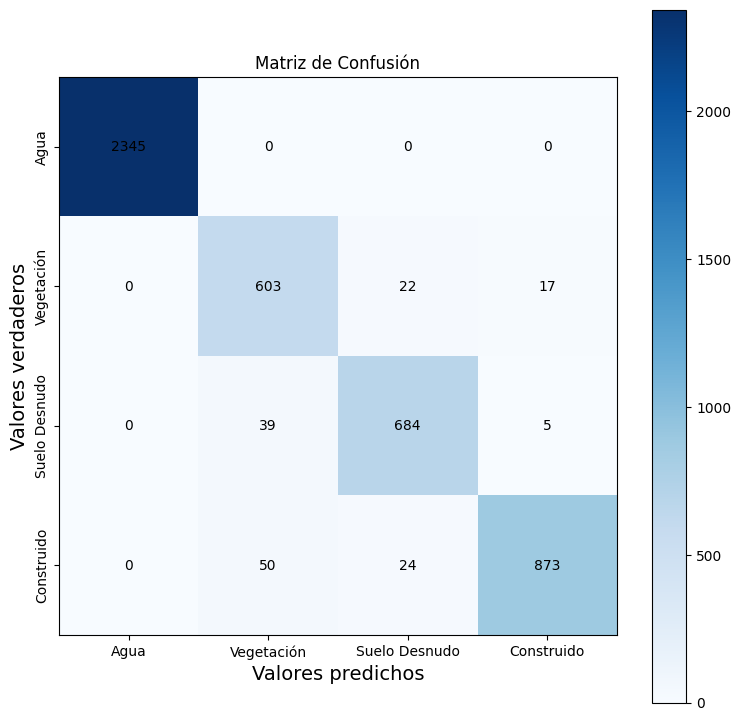

In [ ]:
from matplotlib import pyplot as plt

# Definir las etiquetas
labels = ['Agua', 'Vegetación', 'Suelo Desnudo', 'Construido']

plt.figure(figsize=(9, 9))
plt.imshow(m_knn, cmap='Blues')

# Agregar los valores dentro de la matriz
for i in range(4):
    for j in range(4):
        plt.text(j, i, m_knn[i, j], ha='center', va='center', color='black')

plt.colorbar()

# Etiquetas de los ejes
plt.xticks(range(4), labels)
plt.yticks(range(4), labels, rotation=90, va='center')

# Títulos de los ejes
plt.xlabel('Valores predichos', fontsize = 14)
plt.ylabel('Valores verdaderos', fontsize = 14)

plt.title("Matriz de Confusión")
plt.show()

### Metricas de error

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2345
           1       0.87      0.94      0.90       642
           2       0.94      0.94      0.94       728
           3       0.98      0.92      0.95       947

    accuracy                           0.97      4662
   macro avg       0.95      0.95      0.95      4662
weighted avg       0.97      0.97      0.97      4662



In [ ]:
#Coeficiente KAPPA
from sklearn.metrics import accuracy_score
from sklearn.metrics import cohen_kappa_score as kappa

ceros = np.zeros(100)
un_uno = ceros.copy()
un_uno[0] = 1
otro_uno = ceros.copy()
otro_uno[1] = 1

print(un_uno)
print(ceros)


acc = accuracy_score(un_uno, ceros)
print(f'accuracy: {acc:.3f}')

k = kappa(un_uno, ceros)
print(f'kappa index: {k:.3f}')

[1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]
accuracy: 0.990
kappa index: 0.000


In [ ]:
acc = accuracy_score(y_test, y_pred)
print(f'Precisión global: {acc:.3f}')

k = kappa(y_test, y_pred)
print(f'Índice kappa: {k:.3f}')

Precisión global: 0.966
Índice kappa: 0.949


## 6. Entrenamiento del Modelo - Random Forest



In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Instanciamos el clasificador con 5 vecinos
rf_classifier = RandomForestClassifier(max_depth=10, n_estimators = 100)

# Entrenamos el clasificador
rf_classifier.fit(X_train, y_train)


RandomForestClassifier(max_depth=10)

###Matriz de confusión

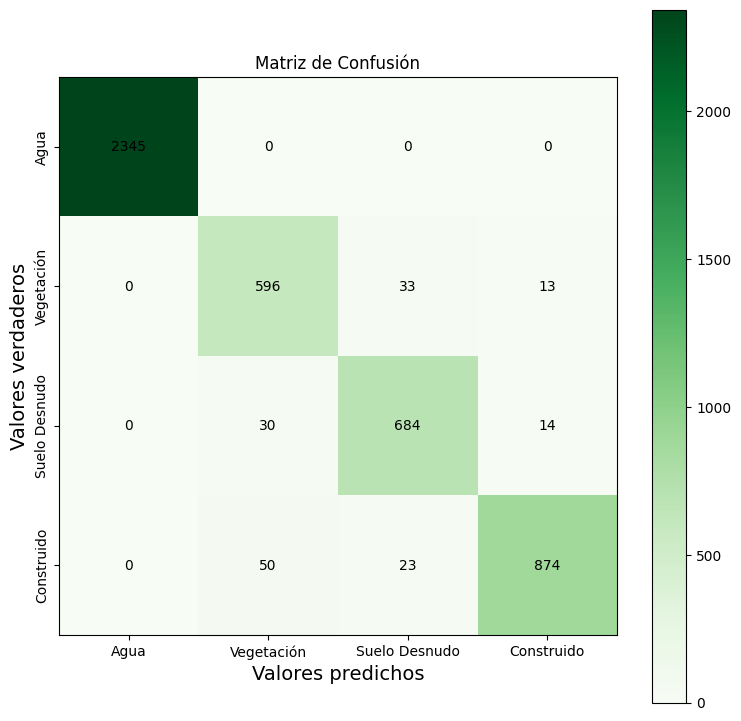

In [ ]:
# Realizamos la predicción
y_pred_rf = rf_classifier.predict(X_test)

# Calculamos la matriz de confusión
m_rf = confusion_matrix(y_test, y_pred_rf)

from matplotlib import pyplot as plt

# Definir las etiquetas
labels = ['Agua', 'Vegetación', 'Suelo Desnudo', 'Construido']

plt.figure(figsize=(9, 9))
plt.imshow(m_rf, cmap='Greens')

# Agregar los valores dentro de la matriz
for i in range(4):
    for j in range(4):
        plt.text(j, i, m_rf[i, j], ha='center', va='center', color='black')

plt.colorbar()

# Etiquetas de los ejes
plt.xticks(range(4), labels)
plt.yticks(range(4), labels, rotation=90, va='center')

# Títulos de los ejes
plt.xlabel('Valores predichos', fontsize = 14)
plt.ylabel('Valores verdaderos', fontsize = 14)

plt.title("Matriz de Confusión")
plt.show()

### Metricas de error

In [ ]:
print(classification_report(y_test, y_pred_rf))

acc = accuracy_score(y_test, y_pred_rf)
print(f'Precisión global: {acc:.3f}')

k = kappa(y_test, y_pred_rf)
print(f'Índice kappa: {k:.3f}')

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2345
           1       0.88      0.93      0.90       642
           2       0.92      0.94      0.93       728
           3       0.97      0.92      0.95       947

    accuracy                           0.97      4662
   macro avg       0.94      0.95      0.95      4662
weighted avg       0.97      0.97      0.97      4662

Precisión global: 0.965
Índice kappa: 0.947


## 7. Clasificación de un nuevo recorte de la imagen (recorte 2)
Polígono generado en QGIS (GEOPACKAGE)



### Obtención de recorte 2 para probar la clasificación que realiza el modelo entrenado con el recorte 1

In [ ]:
#https://drive.google.com/file/d/1j_phaWrPCP0UNHjkBK95gOw1L-lWKk2o/view?usp=sharing

# ID del archivo de Google Drive
file_id = "1j_phaWrPCP0UNHjkBK95gOw1L-lWKk2o"
url = f"https://drive.google.com/uc?id={file_id}"

# Descargar la imagen
output = "recorte2.gpkg"
gdown.download(url, output, quiet=False)

# Leer el polígono
poligono2 = gpd.read_file("recorte2.gpkg", layer='recorte2')

Downloading...
From: https://drive.google.com/uc?id=1j_phaWrPCP0UNHjkBK95gOw1L-lWKk2o
To: /content/recorte2.gpkg
100%|██████████| 106k/106k [00:00<00:00, 75.7MB/s]


In [ ]:
print(poligono2)
print(f'Tipo de objeto: {type(poligono2)}')
print(f'Extensión del polígono: {poligono2.total_bounds}')
print(f'Sistema de coordenadas del polígono: {poligono2.crs}')

                                            geometry
0  POLYGON ((357125.776 6443214.017, 363673.195 6...
Tipo de objeto: <class 'geopandas.geodataframe.GeoDataFrame'>
Extensión del polígono: [ 357125.77599159 6434858.26331505  363766.72941707 6443214.01692082]
Sistema de coordenadas del polígono: EPSG:32720


In [ ]:
poligono2 = ajustar_poligono(poligono2)

print(f'Extensión ajustada del polígono: {poligono2.total_bounds}')

Extensión ajustada del polígono: [ 357120. 6434850.  363770. 6443220.]


<Axes: >

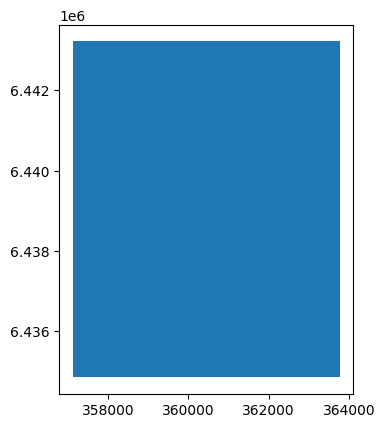

In [ ]:
poligono2.plot()

In [ ]:
s2_clip2, clip_transform2 = mask(dataset=ds,shapes = poligono2.geometry, crop = True)
print('Nuevo transform: ', clip_transform2)
print('Dimensiones del recorte', s2_clip2.shape)
print('Dimensiones del array original', stack_bandas.shape)

Nuevo transform:  | 10.00, 0.00, 357120.00|
| 0.00,-10.00, 6443220.00|
| 0.00, 0.00, 1.00|
Dimensiones del recorte (1, 837, 665)
Dimensiones del array original (4, 10980, 10980)


In [ ]:
# extracción de bandas de 10 metros aplicando recorte con poligono
bands_to_extract =  ['B02', 'B03', 'B04', 'B08']
res = 10
stack_recorte_10m2, metadatos_recorte_10m2 = leer_bandas_l2a(zipfilename, bands_to_extract, res, poligono = poligono2)
metadatos_recorte_10m2

{'driver': 'GTiff',
 'dtype': 'uint16',
 'nodata': None,
 'width': 665,
 'height': 837,
 'count': 4,
 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 20S",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-63],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",10000000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32720"]]'),
 'transform': Affine(10.0, 0.0, 357120.0,
        0.0, -10.0, 6443220.0)}

In [ ]:
# extracción de bandas de 20 metros aplicando recorte con poligono
bands_to_extract =  ['B11', 'B12']
res = 20
stack_recorte_20m2, metadatos_recorte_20m2 = leer_bandas_l2a(zipfilename, bands_to_extract, res, poligono = poligono2)
metadatos_recorte_20m2

{'driver': 'GTiff',
 'dtype': 'uint16',
 'nodata': None,
 'width': 333,
 'height': 419,
 'count': 2,
 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 20S",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-63],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",10000000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32720"]]'),
 'transform': Affine(20.0, 0.0, 357120.0,
        0.0, -20.0, 6443220.0)}

In [ ]:
# Remuestrar las bandas de 20 a la resolución de stack_recorte_10m
stack_b11_b12_10m2 = resample_bands(stack_recorte_20m2, stack_recorte_10m2)
print(f'Dimensiones del stack remuestreado: {stack_b11_b12_10m2.shape}')

Dimensiones del stack remuestreado: (2, 837, 665)


In [ ]:
# Juntar ambos arrays
stack_final2 = np.concatenate((stack_recorte_10m2, stack_b11_b12_10m2), axis = 0)
print(f'Dimensiones del stack final: {stack_final2.shape}')

Dimensiones del stack final: (6, 837, 665)


In [ ]:
poligono2.total_bounds

array([ 357120., 6434850.,  363770., 6443220.])

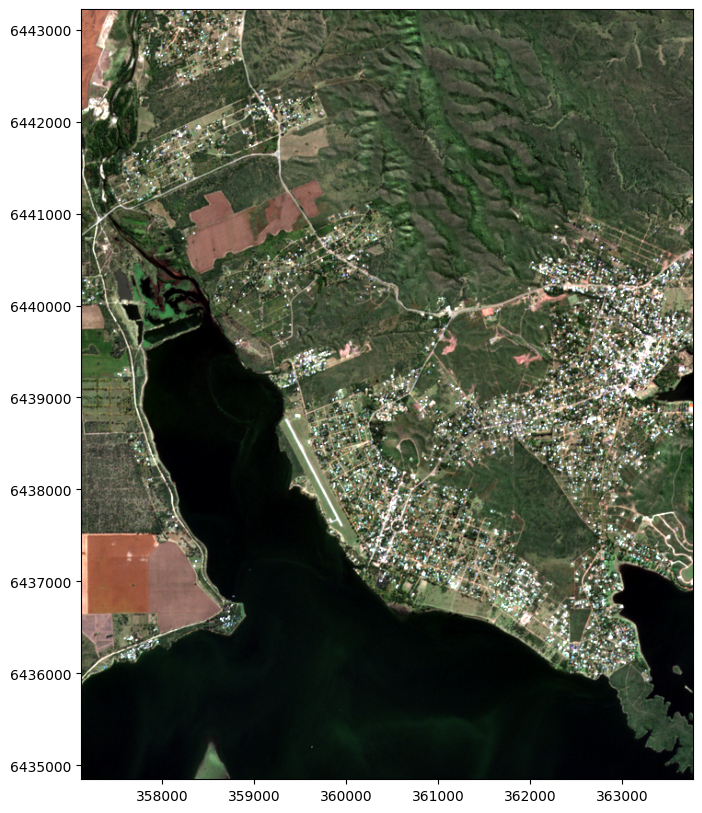

In [ ]:
# Visualizacion de la imagen completa

from matplotlib import pyplot as plt

# el valor de relleno o de _no dato_ en estas imágenes es `0`. Por lo tanto, si queremos hacer laguna visualización en RGB necesitamos pasar ese número como `nodata`
stack_recorte_escalado2 = escalar_imagen_multibanda(stack_final2.transpose(1,2,0), 1, nodata = 0)

left, bottom, right, top = poligono2.total_bounds # Extraer los límites

plt.figure(figsize=(10,10))
plt.imshow(stack_recorte_escalado2[:,:,[2,1,0]], extent=[left, right, bottom, top], origin="upper")
plt.ticklabel_format(style="plain", axis="y")
plt.show()

In [ ]:
# guardar el archivo como GeoTiff

from rasterio.crs import CRS
from affine import Affine

metadatos_stack_final2 = {'driver': 'GTiff',
 'dtype': 'uint16',
 'nodata': 0,
 'width': stack_final2.shape[2],
 'height': stack_final2.shape[1],
 'count': stack_final2.shape[0],
 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 20S",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-63],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",10000000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32720"]]'),
 'transform': metadatos_recorte_10m2['transform']}

# Lista de bandas para set_band_description:
band_list = ['B02', 'B03', 'B04', 'B08', 'B11', 'B12']

# Abrir el archivo en modo escritura
with rasterio.open("S2A_MSIL2A_20180405T141051_rumipal.tif", 'w+', **metadatos_stack_final2) as dataset:
  for i,b in enumerate(band_list):
    dataset.set_band_description(i+1, b) #Agregar una descripción del nombre de la banda desde band_list
  dataset.write(stack_final2) #Escribir el array

In [ ]:
# Abrimos la imagen y leemos sus metadatos
imagen2 = rasterio.open('S2A_MSIL2A_20180405T141051_rumipal.tif')
metadatos2 = imagen2.meta

# La pasammos a array de Numpy
imagen2_bandas = imagen2.read()

# Escalar para combinaciones RGB
imagen2_bandas_escalado = escalar_imagen_multibanda(imagen2_bandas.transpose(1,2,0), 1)

In [ ]:
imagen2_bandas.shape

(6, 837, 665)

In [ ]:
X

,Band_0,Band_1,Band_2,Band_3,Band_4,Band_5
0,1061,1141,1062,1034,1018,1012
1,1087,1152,1082,1033,1019,1007
2,1080,1141,1070,1033,1016,1009
3,1068,1145,1065,1034,1013,1010
4,1068,1138,1068,1033,1014,1013
...,...,...,...,...,...,...
18641,2076,2674,2960,4196,3858,3433
18642,1864,2278,2548,3938,3931,3481
18643,2142,2434,2596,3928,3987,3487
18644,1990,2260,2380,3712,4025,3520


In [ ]:
# Leemos las dimensiones de la imagen
d,x,y = imagen2_bandas.shape

# La redimensionamos
imagen2_bandas = imagen2_bandas.reshape([d, x * y]).T

# Verificamos las nuevas dimensiones
print('Dimensiones nuevas: ', imagen2_bandas.shape)

Dimensiones nuevas:  (556605, 6)


### Extracción de muestras para evaluación del clasificador sobre el nuevo recorte (recorte 2)
No ejecutar


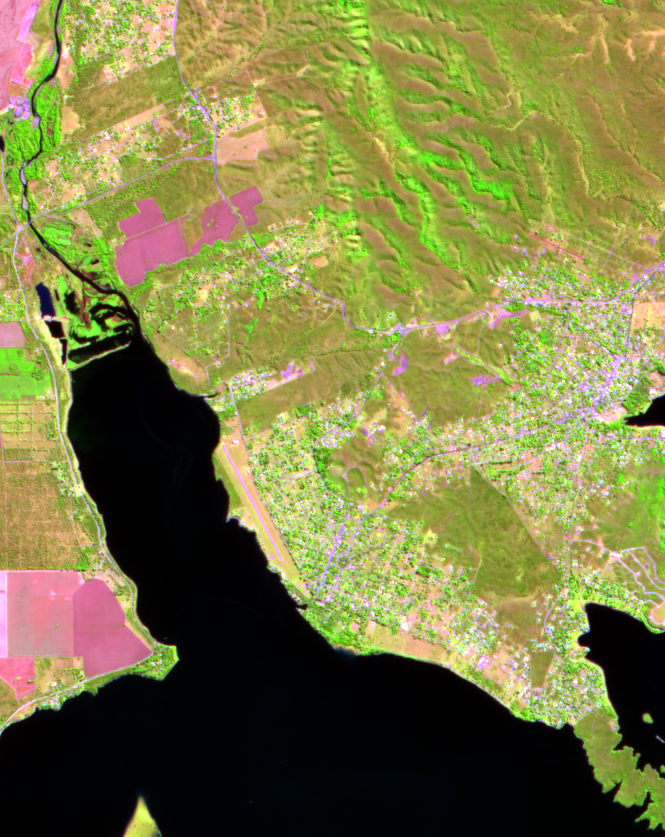

Button(description='Extraer Valores', style=ButtonStyle())

Button(description='Borrar Todo', style=ButtonStyle())

Output()

In [ ]:
# Agua
seleccion_pixeles_agua2 = Extractor(imagen2_bandas, imagen2_bandas_escalado[:,:,[4,3,2]], imagen2.meta)
seleccion_pixeles_agua2.interfaz_seleccion_pixeles()


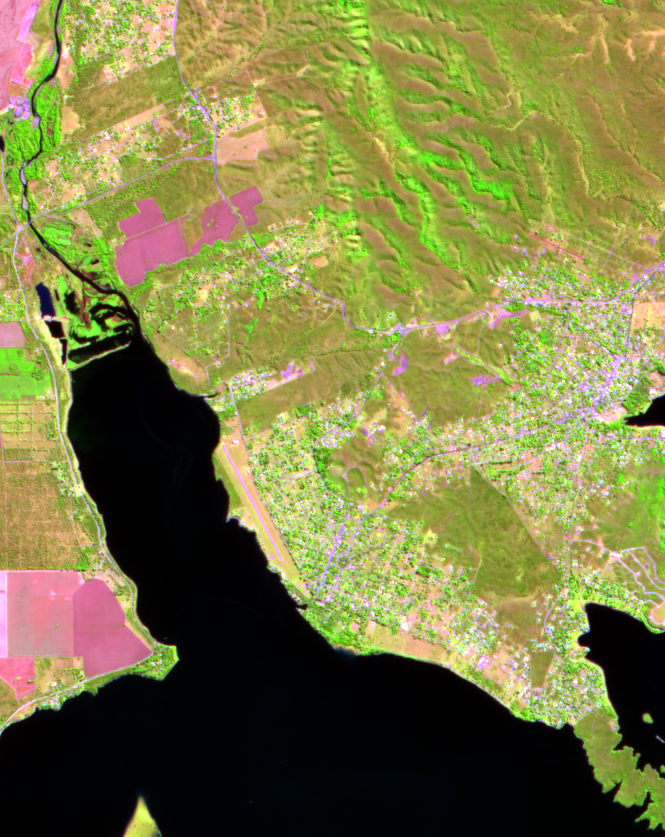

Button(description='Extraer Valores', style=ButtonStyle())

Button(description='Borrar Todo', style=ButtonStyle())

Output()

In [ ]:
# Vegetacion
seleccion_pixeles_vegetacion2 = Extractor(imagen2_bandas, imagen2_bandas_escalado[:,:,[4,3,2]], imagen2.meta)
seleccion_pixeles_vegetacion2.interfaz_seleccion_pixeles()


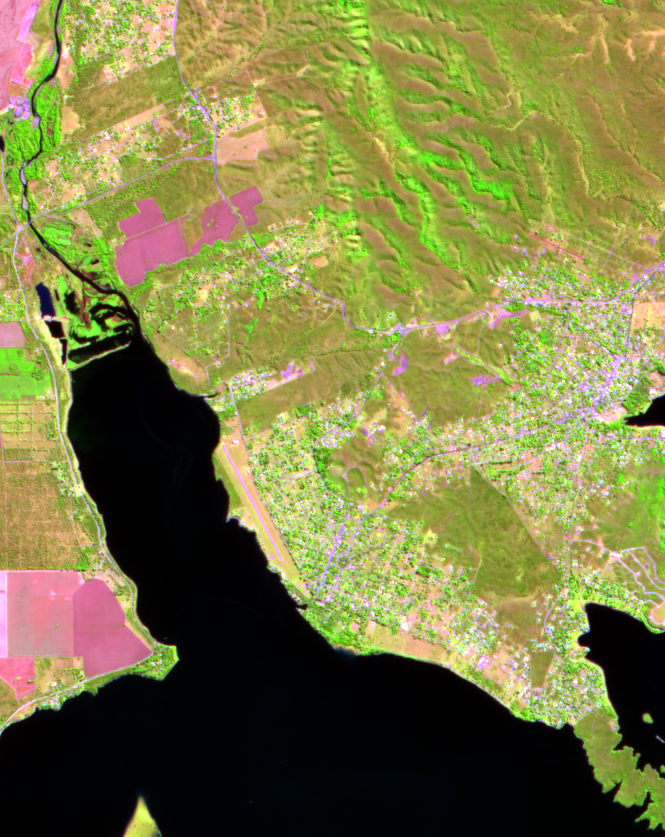

Button(description='Extraer Valores', style=ButtonStyle())

Button(description='Borrar Todo', style=ButtonStyle())

Output()

In [ ]:
# Suelo desnudo
seleccion_pixeles_suelo2 = Extractor(imagen2_bandas, imagen2_bandas_escalado[:,:,[4,3,2]], imagen2.meta)
seleccion_pixeles_suelo2.interfaz_seleccion_pixeles()


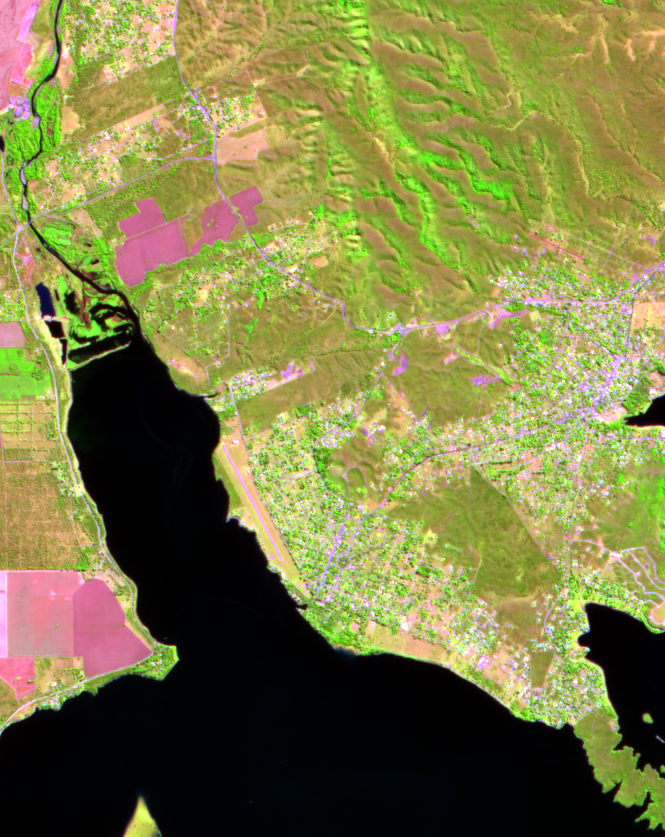

Button(description='Extraer Valores', style=ButtonStyle())

Button(description='Borrar Todo', style=ButtonStyle())

Output()

In [ ]:
# Zonas construidas
seleccion_pixeles_construido2 = Extractor(imagen2_bandas, imagen2_bandas_escalado[:,:,[4,3,2]], imagen2.meta)
seleccion_pixeles_construido2.interfaz_seleccion_pixeles()

In [ ]:
seleccion_pixeles_agua2.extracted_dataframe['Clase'] = 0
seleccion_pixeles_vegetacion2.extracted_dataframe['Clase'] = 1
seleccion_pixeles_suelo2.extracted_dataframe['Clase'] = 2
seleccion_pixeles_construido2.extracted_dataframe['Clase'] = 3

In [ ]:
df_final2 = pd.concat([seleccion_pixeles_agua2.extracted_dataframe,
                      seleccion_pixeles_vegetacion2.extracted_dataframe,
                      seleccion_pixeles_suelo2.extracted_dataframe,
                      seleccion_pixeles_construido2.extracted_dataframe],
                      ignore_index=True)

In [ ]:
df_final2.head()

,Band_0,Band_1,Band_2,Band_3,Band_4,Band_5,X,Y,Rect_ID,Clase
0,1003,1159,1064,1068,1037,1046,85,385,1,0
1,1025,1145,1064,1053,1035,1041,86,385,1,0
2,1039,1136,1058,1036,1033,1041,87,385,1,0
3,1027,1140,1057,1024,1030,1041,88,385,1,0
4,1009,1130,1047,1030,1030,1041,89,385,1,0


In [ ]:
# Guardamos el dataframe como archivo CSV.
df_final2.to_csv('muestras2.csv')

### Clasificador KNN sobre el recorte 2

In [ ]:
#https://drive.google.com/file/d/1KWYbBrO6Se89mwoSnSK7O-r1Oe8GZVIb/view?usp=sharing

file_id = "1KWYbBrO6Se89mwoSnSK7O-r1Oe8GZVIb"
url = f"https://drive.google.com/uc?id={file_id}"

muestras2 = pd.read_csv(url)
muestras2.head()

,Unnamed: 0,Band_0,Band_1,Band_2,Band_3,Band_4,Band_5,X,Y,Rect_ID,Clase
0,0,1003,1159,1064,1068,1037,1046,85,385,1,0
1,1,1025,1145,1064,1053,1035,1041,86,385,1,0
2,2,1039,1136,1058,1036,1033,1041,87,385,1,0
3,3,1027,1140,1057,1024,1030,1041,88,385,1,0
4,4,1009,1130,1047,1030,1030,1041,89,385,1,0


In [ ]:
# Dividimos en X e Y
X_recorte2 = muestras2[['Band_0', 'Band_1', 'Band_2', 'Band_3', 'Band_4', 'Band_5']]
Y_recorte2 = muestras2['Clase']

In [ ]:
# Redimensionamos para que vuelva a tener estructura espacial
img_pred_knn2 = rf_classifier.predict(imagen2_bandas)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


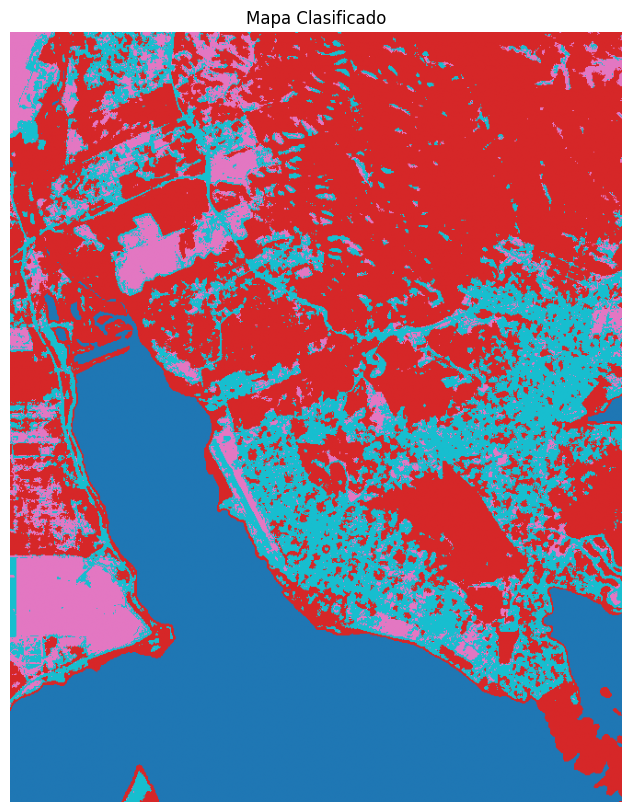

In [ ]:
# Redimensionamos para que vuelva a tener estructura espacial
img_pred_knn2 = img_pred_knn2.reshape(x,y)

# Plotemos el resultado:
plt.figure(figsize=(10,10))
plt.imshow(img_pred_knn2, cmap='tab10')
plt.axis("off")
plt.title("Mapa Clasificado")
plt.show()

#### Métricas de error

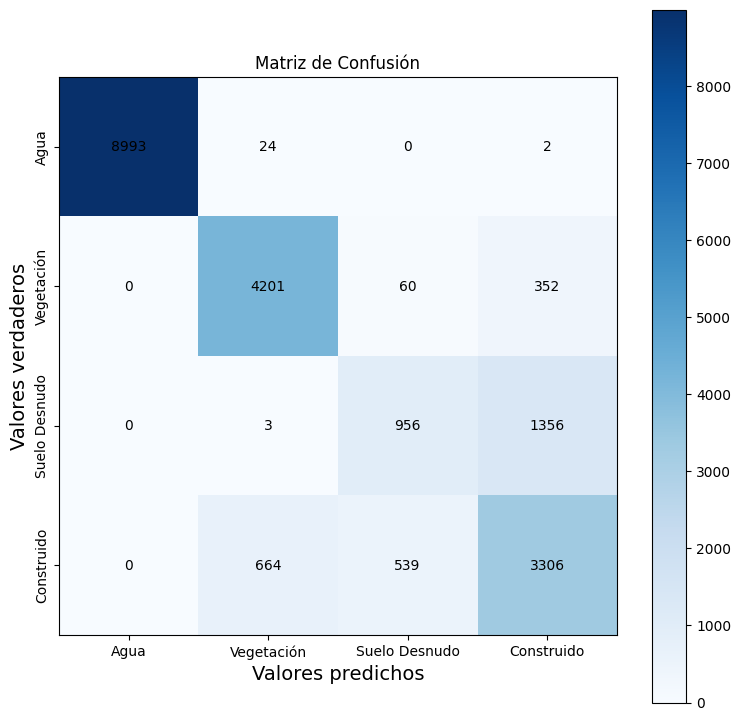

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      9019
           1       0.86      0.91      0.88      4613
           2       0.61      0.41      0.49      2315
           3       0.66      0.73      0.69      4509

    accuracy                           0.85     20456
   macro avg       0.78      0.76      0.77     20456
weighted avg       0.85      0.85      0.85     20456

Precisión global: 0.853
Índice kappa: 0.787


In [ ]:
# Calculamos la matriz de confusión
img_pred_knn = knn_classifier.predict(X_recorte2)
m_knn_recorte2 = confusion_matrix(Y_recorte2, img_pred_knn)

# Definir las etiquetas
labels = ['Agua', 'Vegetación', 'Suelo Desnudo', 'Construido']

plt.figure(figsize=(9, 9))
plt.imshow(m_knn_recorte2, cmap='Blues')

# Agregar los valores dentro de la matriz
rows, cols = m_knn_recorte2.shape

for i in range(rows):
    for j in range(cols):
        plt.text(j, i, m_knn_recorte2[i, j], ha='center', va='center', color='black')
plt.colorbar()

# Etiquetas de los ejes
plt.xticks(range(4), labels)
plt.yticks(range(4), labels, rotation=90, va='center')

# Títulos de los ejes
plt.xlabel('Valores predichos', fontsize = 14)
plt.ylabel('Valores verdaderos', fontsize = 14)

plt.title("Matriz de Confusión")
plt.show()

print(classification_report(Y_recorte2, img_pred_knn))

acc = accuracy_score(Y_recorte2, img_pred_knn)
print(f'Precisión global: {acc:.3f}')

k = kappa(Y_recorte2, img_pred_knn)
print(f'Índice kappa: {k:.3f}')

In [ ]:
# Generar los metadatos para guardar la clasificación
metadatos_clasif = metadatos.copy()
metadatos_clasif['count'] = 1
metadatos_clasif['nodata'] = np.iinfo(np.uint16).max

# Guardar la clasificación
with rasterio.open("img_pred_knn.tif", 'w', **metadatos_clasif) as dst:
    dst.write(np.expand_dims(img_pred_knn2, axis=0))

### Clasificador RF sobre el recorte 2

In [ ]:
# Hacemos la predicción
img_pred_rf = rf_classifier.predict(imagen2_bandas)

# Vemos las simensiones de la predicción y los valores únicos
print('Dimensiones: ', img_pred_rf.shape)
print('Valores únicos', np.unique(img_pred_rf))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Dimensiones:  (556605,)
Valores únicos [0 1 2 3]


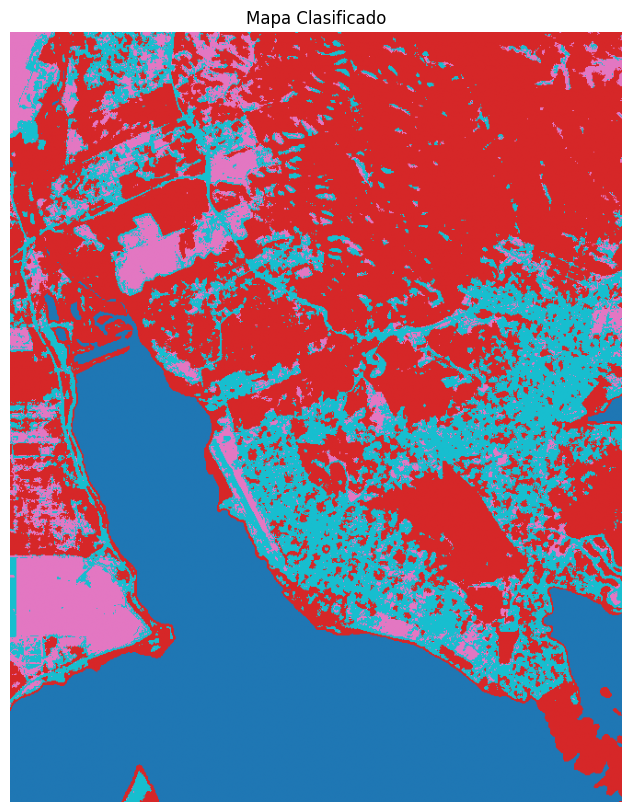

In [ ]:
# Redimensionamos para que vuelva a tener estructura espacial
img_pred_rf = img_pred_rf.reshape(x,y)


# Plotemos el resultado:
plt.figure(figsize=(10,10))
plt.imshow(img_pred_rf, cmap='tab10')
plt.axis("off")
plt.title("Mapa Clasificado")
plt.show()

#### Métricas de error

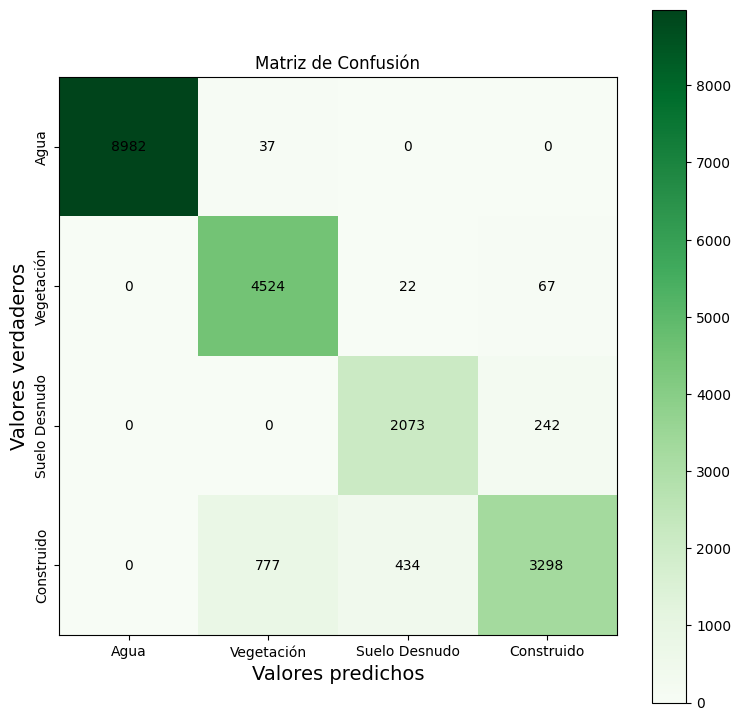

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      9019
           1       0.85      0.98      0.91      4613
           2       0.82      0.90      0.86      2315
           3       0.91      0.73      0.81      4509

    accuracy                           0.92     20456
   macro avg       0.90      0.90      0.89     20456
weighted avg       0.93      0.92      0.92     20456

Precisión global: 0.923
Índice kappa: 0.889


In [ ]:
# Calculamos la matriz de confusión
img_pred_rf2 = rf_classifier.predict(X_recorte2)
m_rf_recorte2 = confusion_matrix(Y_recorte2, img_pred_rf2)

# Definir las etiquetas
labels = ['Agua', 'Vegetación', 'Suelo Desnudo', 'Construido']

plt.figure(figsize=(9, 9))
plt.imshow(m_rf_recorte2, cmap='Greens')

# Agregar los valores dentro de la matriz
rows, cols = m_rf_recorte2.shape

for i in range(rows):
    for j in range(cols):
        plt.text(j, i, m_rf_recorte2[i, j], ha='center', va='center', color='black')
plt.colorbar()

# Etiquetas de los ejes
plt.xticks(range(4), labels)
plt.yticks(range(4), labels, rotation=90, va='center')

# Títulos de los ejes
plt.xlabel('Valores predichos', fontsize = 14)
plt.ylabel('Valores verdaderos', fontsize = 14)

plt.title("Matriz de Confusión")
plt.show()

print(classification_report(Y_recorte2, img_pred_rf2))

acc = accuracy_score(Y_recorte2, img_pred_rf2)
print(f'Precisión global: {acc:.3f}')

k = kappa(Y_recorte2,img_pred_rf2)
print(f'Índice kappa: {k:.3f}')

In [ ]:
# Generar los metadatos para guardar la clasificación
metadatos_clasif2 = metadatos.copy()
metadatos_clasif2['count'] = 1
metadatos_clasif2['nodata'] = np.iinfo(np.uint16).max

# Guardar la clasificación
with rasterio.open("img_pred_rf.tif", 'w', **metadatos_clasif2) as dst:
    dst.write(np.expand_dims(img_pred_rf, axis=0))